In [23]:
import torch
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import os
import umap
from utils.label_dict import protein_to_num_full
from matplotlib import cm
cmap = cm.nipy_spectral


In [4]:
cd ..

/home/nick/Dino4Cells_analysis


In [5]:
files, classes, extras, IDs = torch.load('results_01_09_from_features_1channel_dino/processed_data.pth')

In [30]:
classes

[tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0]),
 tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0]),
 tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0]),
 tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0]),
 tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0]),
 tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0]),
 tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0]),
 tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0]),
 tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0]),
 tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

In [27]:
mapping

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27])

In [9]:
from utils.label_dict import protein_to_num_full, protein_to_num_single_cells

In [11]:
mapping_dict = protein_to_num_full

In [24]:
target_labels = ['nucleoplasm', 'nuclear membrane', 'nucleoli', 'nucleoli fibrillar center', 'nuclear speckles', 'nuclear bodies', 'endoplasmic reticulum', 'golgi apparatus', 'peroxisomes', 'endosomes', 'lysosomes', 'intermediate filaments', 'actin filaments', 'focal adhesion sites', 'microtubules', 'microtubule ends', 'cytokinetic bridge', 'mitotic spindle', 'microtubule organizing center', 'centrosome', 'lipid droplets', 'plasma membrane', 'cell junctions', 'mitochondria', 'aggresome', 'cytosol', 'cytoplasmic bodies', 'rods & rings']


In [26]:
mapping = np.arange(len(target_labels))
for ind, p in enumerate(list(mapping_dict.keys())):
    mapping[ind] = target_labels.index(p)

In [29]:
mapping

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27])

In [31]:

# Convert one-hot tensors to numpy arrays
numpy_arrays = [tensor.numpy() for tensor in classes]

# Sum the numpy arrays along the appropriate axis (axis=0 in this case)
counts = np.sum(numpy_arrays, axis=0)

# Create histograms (if needed)
histogram, bin_edges = np.histogram(counts, bins=range(0, counts.max() + 1))

# Print counts and histogram
print("Counts:", counts)
print("Histogram:", histogram)
print("Bin Edges:", bin_edges)

Counts: [  960   160  1086  1479   542   300 22761  2046    92   576  4528   626
   165    98    17   619  1201  5695   147  2453  1288  2629  4407  1558
 33346   139  7563    45]
Histogram: [0 0 0 ... 0 0 1]
Bin Edges: [    0     1     2 ... 33344 33345 33346]


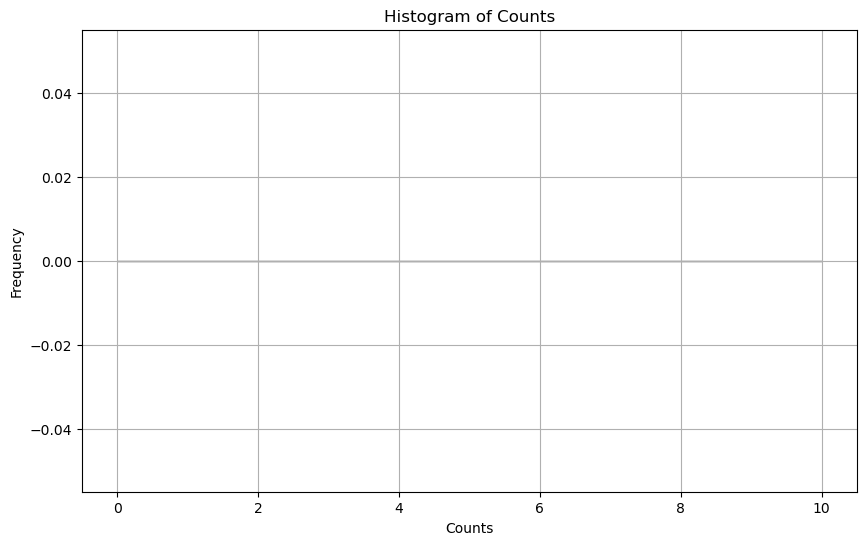

In [36]:
# Define the number of bins and the range for the histogram
num_bins = 10  # Adjust as needed
hist_min, hist_max = 0, 10  # Adjust the range as needed
# Create a histogram
histogram, bin_edges = np.histogram(counts, bins=num_bins, range=(hist_min, hist_max))

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(counts, bins=num_bins, range=(hist_min, hist_max), edgecolor='k', alpha=0.75)
plt.title('Histogram of Counts')
plt.xlabel('Counts')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [41]:


# Define the file path
file_path = "results/classification_output/submission_whole_images.csv"  # Adjust the path as needed

# Read the CSV file into a pandas DataFrame
df = pd.read_csv(file_path, header=0)

# Display the DataFrame
print(df)

                     Id Predicted
0        10005_921_B9_1         0
1        10005_921_B9_2        25
2        10005_923_B9_1        25
3        10005_923_B9_2        25
4      10007_1876_A7_32         0
...                 ...       ...
75611      99_611_F12_2         0
75612      99_614_F12_2         0
75613      99_614_F12_3         0
75614      99_618_F12_1         0
75615      99_618_F12_2         0

[75616 rows x 2 columns]


In [4]:
df['Class'] = df['Predicted']

# Split the "Predicted" column by space and take the maximum value
df["Predicted"] = df["Predicted"].apply(lambda x: max(map(int, x.split())))

# Plot the histogram
plt.hist(df["Predicted"], bins=range(df["Predicted"].min(), df["Predicted"].max() + 2), align='left', rwidth=0.8)

# Add labels and title
plt.xlabel("Predicted Class")
plt.ylabel("Frequency")
plt.title("Histogram of Predicted Classes")

# Show the plot
plt.show()

# Convert the "Class" column to integers (in case it's not already)
df["Class"] = df["Predicted"].astype(int)

# Plot the histogram
plt.hist(df["Class"], bins=range(df["Class"].min(), df["Class"].max() + 2), align='left', rwidth=0.8)

# Add labels and title
plt.xlabel("Predicted Class")
plt.ylabel("Frequency")
plt.title("Histogram of Predicted Classes")

# Show the plot
plt.show()

NameError: name 'df' is not defined

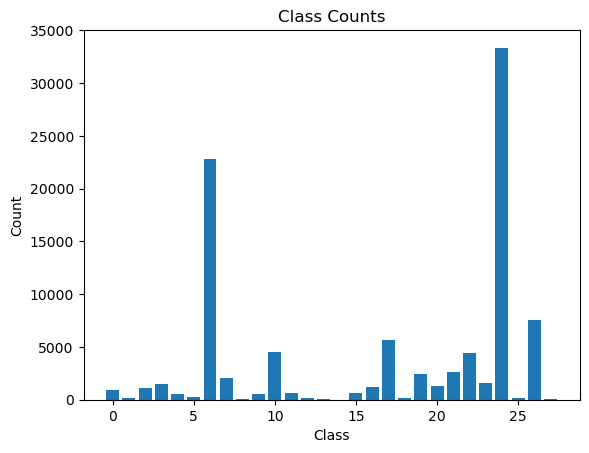

In [49]:
# Your class labels and counts
class_labels = list(range(28))
class_counts = [960, 160, 1086, 1479, 542, 300, 22761, 2046, 92, 576, 4528, 626, 165, 98, 17, 619, 1201, 5695, 147, 2453, 1288, 2629, 4407, 1558, 33346, 139, 7563, 45]

# Ensure both lists have the same length
if len(class_labels) != len(class_counts):
    raise ValueError("Class labels and counts must have the same length")

# Create a bar plot
plt.bar(class_labels, class_counts)

# Add labels and a title
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Class Counts')

# Show the plot
plt.show()

In [48]:
len(class_counts)

28

In [50]:
protein_to_num_full

{'nucleoplasm': 0,
 'nuclear membrane': 1,
 'nucleoli': 2,
 'nucleoli fibrillar center': 3,
 'nuclear speckles': 4,
 'nuclear bodies': 5,
 'endoplasmic reticulum': 6,
 'golgi apparatus': 7,
 'peroxisomes': 8,
 'endosomes': 9,
 'lysosomes': 10,
 'intermediate filaments': 11,
 'actin filaments': 12,
 'focal adhesion sites': 13,
 'microtubules': 14,
 'microtubule ends': 15,
 'cytokinetic bridge': 16,
 'mitotic spindle': 17,
 'microtubule organizing center': 18,
 'centrosome': 19,
 'lipid droplets': 20,
 'plasma membrane': 21,
 'cell junctions': 22,
 'mitochondria': 23,
 'aggresome': 24,
 'cytosol': 25,
 'cytoplasmic bodies': 26,
 'rods & rings': 27}

## Umaps of 4d data -- testing and training. 

In [6]:
dir = '/home/nick/Dino4Cells_analysis'
kaggle_test_file = 'results_12_23_from_features_4channel_dino_blue_first.pth'
kaggle_test = torch.load(os.path.join(dir, kaggle_test_file))

In [7]:
kaggle_train_file = 'results_01_11_from_features_4channel_dino_train.pth'
kaggle_train = torch.load(os.path.join(dir, kaggle_train_file))

In [8]:
reducer = umap.UMAP(random_state=42)
embedding = reducer.fit_transform(kaggle_train[0])

/home/nick/miniconda3/envs/dino_cuda12/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


/tmp/ipykernel_9780/1324320536.py:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(embedding[:, 0], embedding[:, 1], cmap='Spectral', s=5)


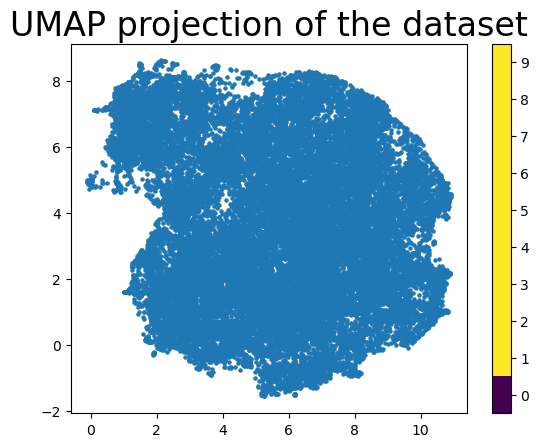

In [9]:
plt.scatter(embedding[:, 0], embedding[:, 1], cmap='Spectral', s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(11)-0.5).set_ticks(np.arange(10))
plt.title('UMAP projection of the dataset', fontsize=24)
plt.show()

In [6]:
train_path = '/home/nick/data/HPA_FOV_data/4channel_12_18_DINO_features_for_HPA_FOV.pth'

In [15]:
features, protein_localizations, cell_lines, IDs = torch.load(train_path)

In [8]:
df_path = 'exploratory_configs/filtered_updated_whole_images.csv'
train_df = pd.read_csv(df_path)

In [9]:
train_df

,Unnamed: 0,file,protein_location,cell_type,ID,nucleoplasm,nuclear membrane,nucleoli,nucleoli fibrillar center,nuclear speckles,...,RT4,SH-SY5Y,SK-MEL-30,SiHa,SuSa,THP-1,U-2 OS,U-251 MG,hTCEpi,hTERT-RPE1
0,0,/home/nick/custom_scripts/path/to/output_dir/4...,['vesicles'],A-431,49232_769_H3_1,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,1,/home/nick/custom_scripts/path/to/output_dir/4...,['vesicles'],A-431,49232_769_H3_11,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,2,/home/nick/custom_scripts/path/to/output_dir/4...,['vesicles'],U-2 OS,49232_761_H3_1,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
3,3,/home/nick/custom_scripts/path/to/output_dir/4...,['vesicles'],U-2 OS,49232_761_H3_2,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
4,4,/home/nick/custom_scripts/path/to/output_dir/4...,['vesicles'],U-251 MG,49232_757_H3_1,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74943,86806,/home/nick/custom_scripts/path/to/output_dir/6...,['nucleoplasm'],MCF7,60380_1082_E3_6,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
74944,86807,/home/nick/custom_scripts/path/to/output_dir/6...,['nucleoplasm'],U-2 OS,60380_1103_E3_1,True,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
74945,86808,/home/nick/custom_scripts/path/to/output_dir/6...,['nucleoplasm'],U-2 OS,60380_1103_E3_2,True,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
74946,86809,/home/nick/custom_scripts/path/to/output_dir/6...,['nucleoplasm'],U-251 MG,60380_1252_F10_3,True,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False


In [11]:
reducer = umap.UMAP(random_state=42)


In [40]:
len(train_data[0])

74948

In [39]:
embedding = reducer.fit_transform(train_data[0])

/home/nick/miniconda3/envs/dino_cuda12/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [18]:
protein_labels = protein_to_num_full

In [19]:
def plot_UMAP(df, labels, embedding, title, color_indices):
    mat, labels = get_col_matrix(df, labels)
    plt.figure(figsize=(10, 10), facecolor='white', dpi=300)
    plt.axis(False)
    plt.scatter(embedding[:, 0],
                embedding[:, 1],
                s=0.01,
                label='All data',
                color='grey'
               )
    for i, ind in enumerate(np.argsort(mat.sum(axis=0))[::-1]):
        indices = np.where((mat[:, ind] == 1) & (mat.sum(axis=1) == 1))[0]
        plt.scatter(embedding[indices, 0],
                    embedding[indices, 1],
                    s=0.01,
                    label=labels[ind],
                    color=cmap(color_indices[ind] / mat.shape[1])
                   )

    plt.xlabel('UMAP 1')
    plt.ylabel('UMAP 2')
    plt.title(title, fontsize=15)
    lgnd = plt.legend(bbox_to_anchor=(1, 1), frameon=False)
    for h in lgnd.legendHandles:
        h._sizes = [30]

    # Display the plot
    plt.show()

In [33]:
protein_color_indices = torch.load('/home/nick/data/HPA_FOV_data/whole_image_protein_color_indices.pth')
cell_color_indices = torch.load('/home/nick/data/HPA_FOV_data/whole_image_cell_color_indices.pth')


/tmp/ipykernel_10705/1047878720.py:24: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for h in lgnd.legendHandles:


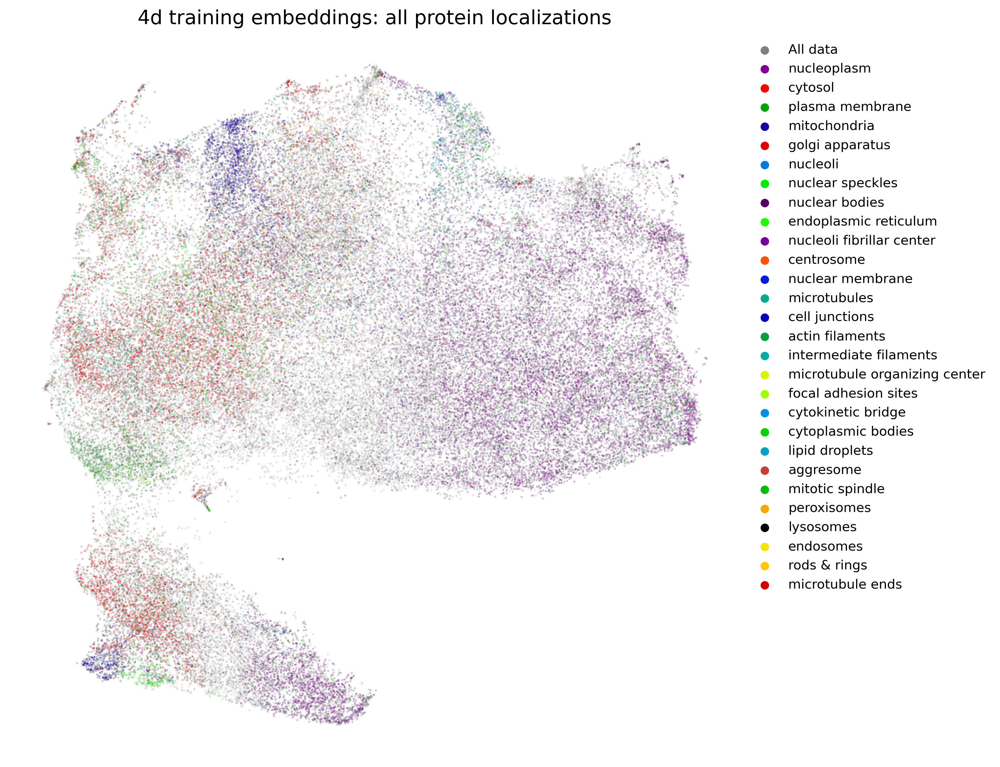

In [43]:
plot_UMAP(train_df, protein_labels, embedding,  f'4d training embeddings: all protein localizations',protein_color_indices)

/tmp/ipykernel_10705/1047878720.py:24: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for h in lgnd.legendHandles:


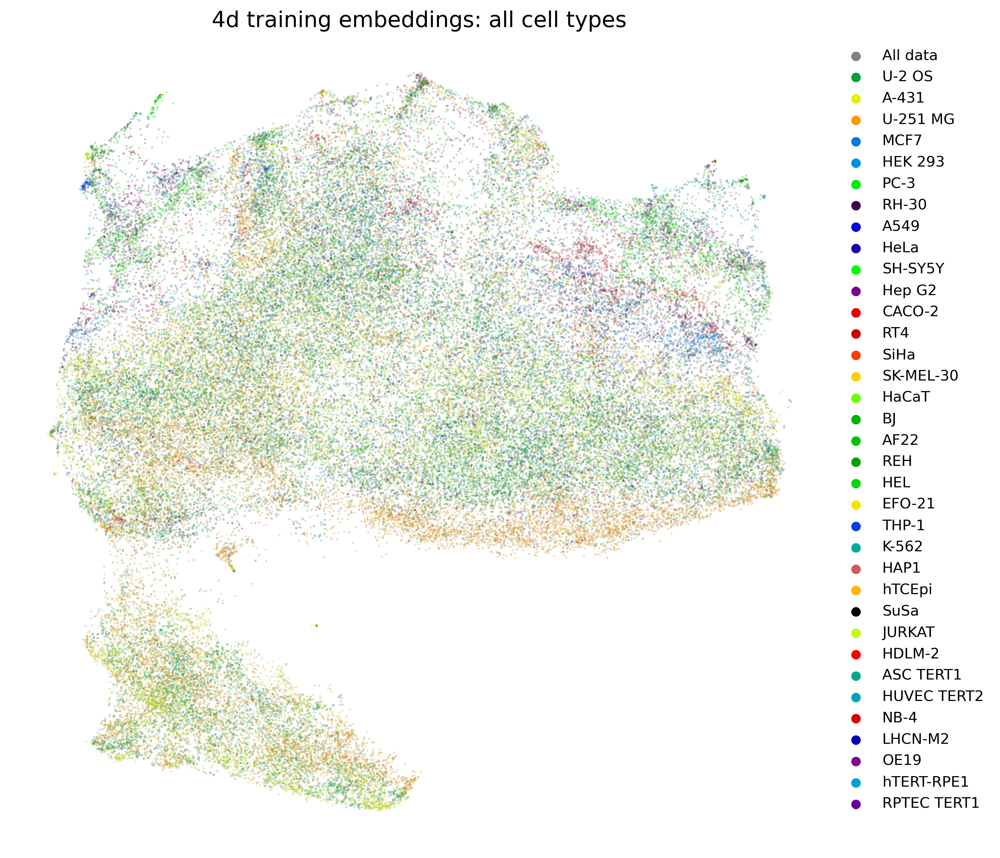

In [42]:
plot_UMAP(train_df, ['cell_type'], embedding,  f'4d training embeddings: all cell types',cell_color_indices)

/tmp/ipykernel_10705/1324320536.py:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(embedding[:, 0], embedding[:, 1], cmap='Spectral', s=5)


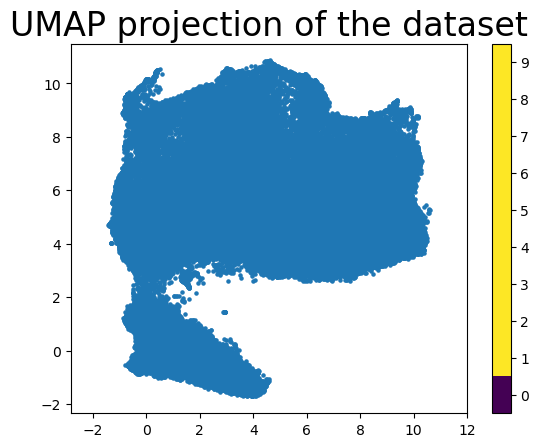

In [13]:
plt.scatter(embedding[:, 0], embedding[:, 1], cmap='Spectral', s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(11)-0.5).set_ticks(np.arange(10))
plt.title('UMAP projection of the dataset', fontsize=24)
plt.show()

In [25]:
def get_col_matrix(df, labels):
    if len(labels) == 1:
        values = df[labels[0]]
        unique_values = sorted(np.unique(values))
        mat = np.zeros((len(df), len(unique_values)))
        for ind, value in enumerate(unique_values):
            mat[np.where(values == value)[0], ind] = 1
        columns = unique_values
    else:
        mat = df[sorted(labels)].values.astype(int)
        columns = sorted(labels)
    return mat, columns

## Umaps of 1d data -- testing and training. 

In [28]:
train_path = '/home/nick/Dino4Cells_analysis/results_01_09_from_features_1channel_dino/processed_data.pth'

In [29]:
features, protein_localizations, cell_lines, IDs = torch.load(train_path)

In [35]:
len(IDs)

75616

In [31]:
embedding = reducer.fit_transform(features)

/home/nick/miniconda3/envs/dino_cuda12/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


/tmp/ipykernel_10705/1047878720.py:24: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for h in lgnd.legendHandles:


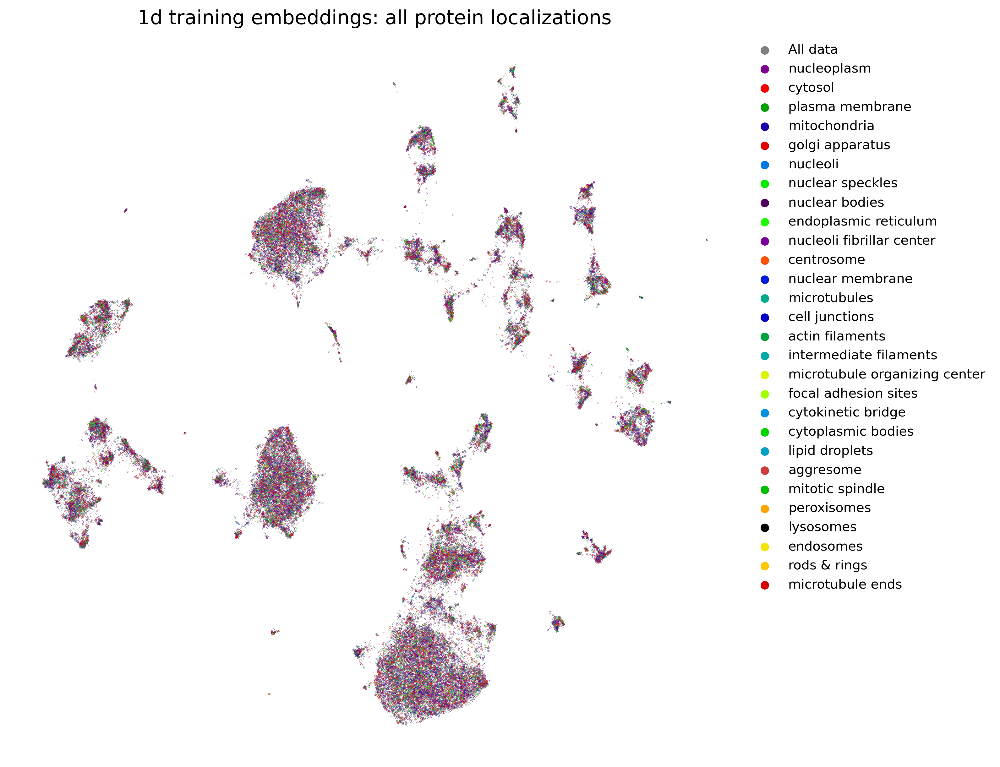

In [37]:
plot_UMAP(train_df, protein_labels, embedding,  f'1d training embeddings: all protein localizations',protein_color_indices)

/tmp/ipykernel_10705/1047878720.py:24: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for h in lgnd.legendHandles:


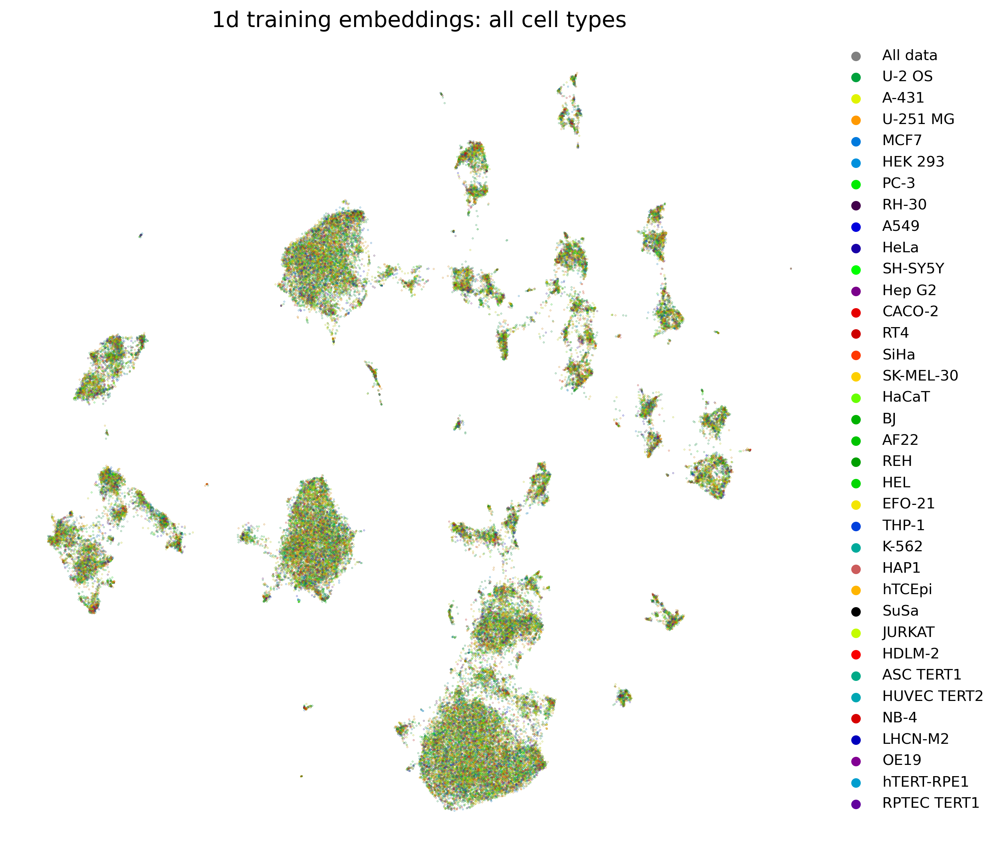

In [38]:
plot_UMAP(train_df, ['cell_type'], embedding,  f'1d training embeddings: all cell types',cell_color_indices)